In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score,roc_curve, classification_report
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pickle

In [2]:
df=pd.read_csv("HR_Data.csv")

In [3]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
df.shape

(1470, 35)

In [5]:
pf=ProfileReport(df)

In [6]:
pf

Summarize dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Analysis of Data

In [7]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [8]:
#Need to drop the columns having only one distinct values

df.drop(columns=["EmployeeCount","Over18","StandardHours"],inplace=True)

In [9]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,...,3,4,0,17,3,2,9,6,0,8


In [10]:
#Now need to convert the target categorical variable into numerical varoiable

from sklearn.preprocessing import LabelEncoder

In [11]:
le=LabelEncoder()

In [12]:
df["Attrition"]=le.fit_transform(df["Attrition"])

In [13]:
#Now need to convert all categorical varibles into Numerical variables

df=df.apply(le.fit_transform)

In [53]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23,1,2,624,2,0,1,1,0,1,...,0,0,0,8,0,0,6,4,0,5
1,31,0,1,113,1,7,0,1,1,2,...,1,3,1,10,3,2,10,7,1,7
2,19,1,2,805,1,1,1,4,2,3,...,0,1,0,7,3,2,0,0,0,0
3,15,0,1,820,1,2,3,1,3,3,...,0,2,0,8,3,2,8,7,3,0
4,9,0,2,312,1,1,0,3,4,0,...,0,3,1,6,3,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18,0,1,494,1,22,1,3,1465,2,...,0,2,1,17,3,2,5,2,0,3
1466,21,0,2,327,1,5,0,3,1466,3,...,0,0,1,9,5,2,7,7,1,7
1467,9,0,2,39,1,3,2,1,1467,1,...,1,1,1,6,0,2,6,2,0,3
1468,31,0,1,579,2,1,2,3,1468,3,...,0,3,0,17,3,1,9,6,0,8


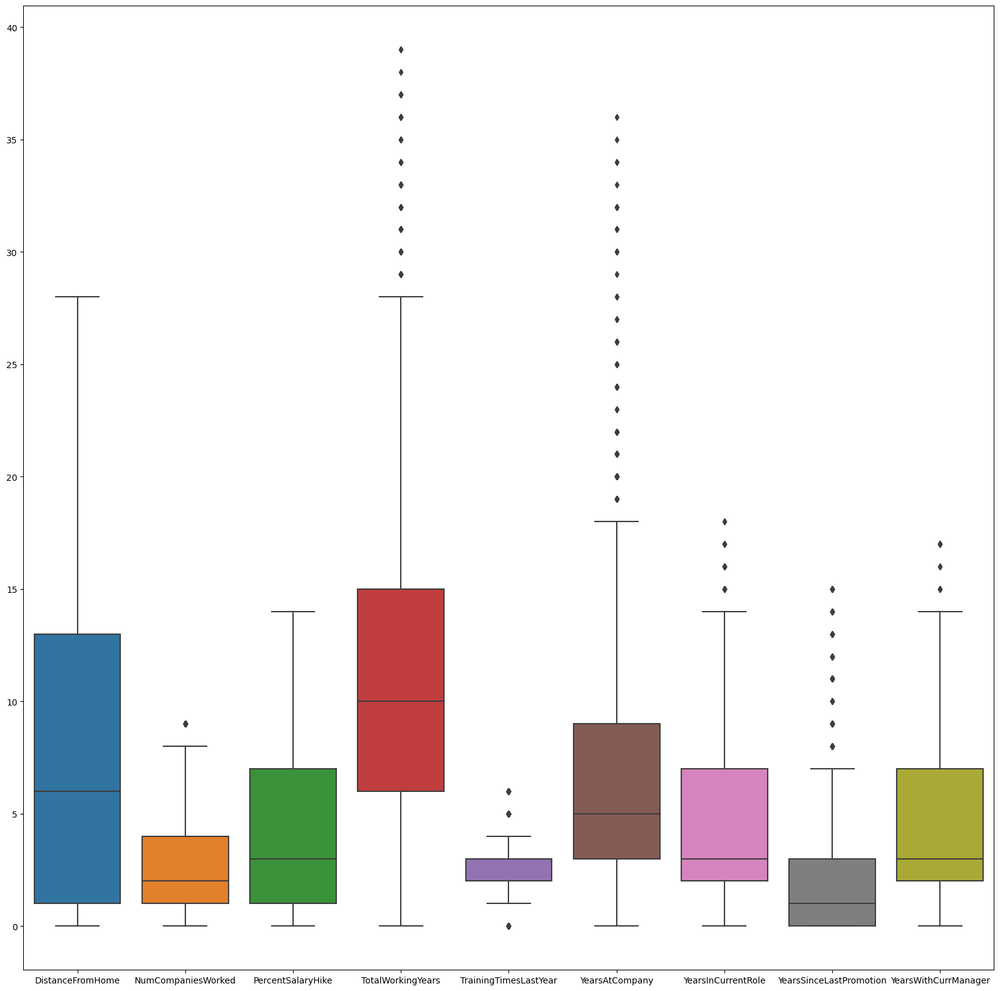

In [50]:
#As the dataset is skewed , need to check the outliers

fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df[["DistanceFromHome","NumCompaniesWorked","PercentSalaryHike","TotalWorkingYears","TrainingTimesLastYear","YearsAtCompany","YearsInCurrentRole","YearsSinceLastPromotion","YearsWithCurrManager"]],ax=ax)
plt.show()

In [51]:
#As per the boxplot conclusion we have got fair amount of Outliers and need to do the Outlier treatement
#Removing some outliers by Quantile method

q=df["YearsAtCompany"].quantile(.95)
df_new=df[df["YearsAtCompany"] < q]


In [52]:
df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23,1,2,624,2,0,1,1,0,1,...,0,0,0,8,0,0,6,4,0,5
1,31,0,1,113,1,7,0,1,1,2,...,1,3,1,10,3,2,10,7,1,7
2,19,1,2,805,1,1,1,4,2,3,...,0,1,0,7,3,2,0,0,0,0
3,15,0,1,820,1,2,3,1,3,3,...,0,2,0,8,3,2,8,7,3,0
4,9,0,2,312,1,1,0,3,4,0,...,0,3,1,6,3,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18,0,1,494,1,22,1,3,1465,2,...,0,2,1,17,3,2,5,2,0,3
1466,21,0,2,327,1,5,0,3,1466,3,...,0,0,1,9,5,2,7,7,1,7
1467,9,0,2,39,1,3,2,1,1467,1,...,1,1,1,6,0,2,6,2,0,3
1468,31,0,1,579,2,1,2,3,1468,3,...,0,3,0,17,3,1,9,6,0,8


In [55]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [56]:
#Outliers Treatement

q=df["TotalWorkingYears"].quantile(.98)
df_new=df[df["TotalWorkingYears"]  < q]

q=df_new["YearsSinceLastPromotion"].quantile(.99)
df_new=df_new[df_new["YearsSinceLastPromotion"]  < q]

q=df_new["YearsInCurrentRole"].quantile(.99)
df_new=df_new[df_new["YearsInCurrentRole"]  < q]


q=df_new["YearsWithCurrManager"].quantile(.95)
df_new=df_new[df_new["YearsWithCurrManager"]  < q]


q=df_new["TrainingTimesLastYear"].quantile(.99)
df_new=df_new[df_new["TrainingTimesLastYear"]  < q]

q=df_new["NumCompaniesWorked"].quantile(.99)
df_new=df_new[df_new["NumCompaniesWorked"]  < q]

In [57]:
df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23,1,2,624,2,0,1,1,0,1,...,0,0,0,8,0,0,6,4,0,5
1,31,0,1,113,1,7,0,1,1,2,...,1,3,1,10,3,2,10,7,1,7
2,19,1,2,805,1,1,1,4,2,3,...,0,1,0,7,3,2,0,0,0,0
3,15,0,1,820,1,2,3,1,3,3,...,0,2,0,8,3,2,8,7,3,0
5,14,0,1,572,1,1,1,1,5,3,...,0,2,0,8,2,1,7,7,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18,0,1,494,1,22,1,3,1465,2,...,0,2,1,17,3,2,5,2,0,3
1466,21,0,2,327,1,5,0,3,1466,3,...,0,0,1,9,5,2,7,7,1,7
1467,9,0,2,39,1,3,2,1,1467,1,...,1,1,1,6,0,2,6,2,0,3
1468,31,0,1,579,2,1,2,3,1468,3,...,0,3,0,17,3,1,9,6,0,8


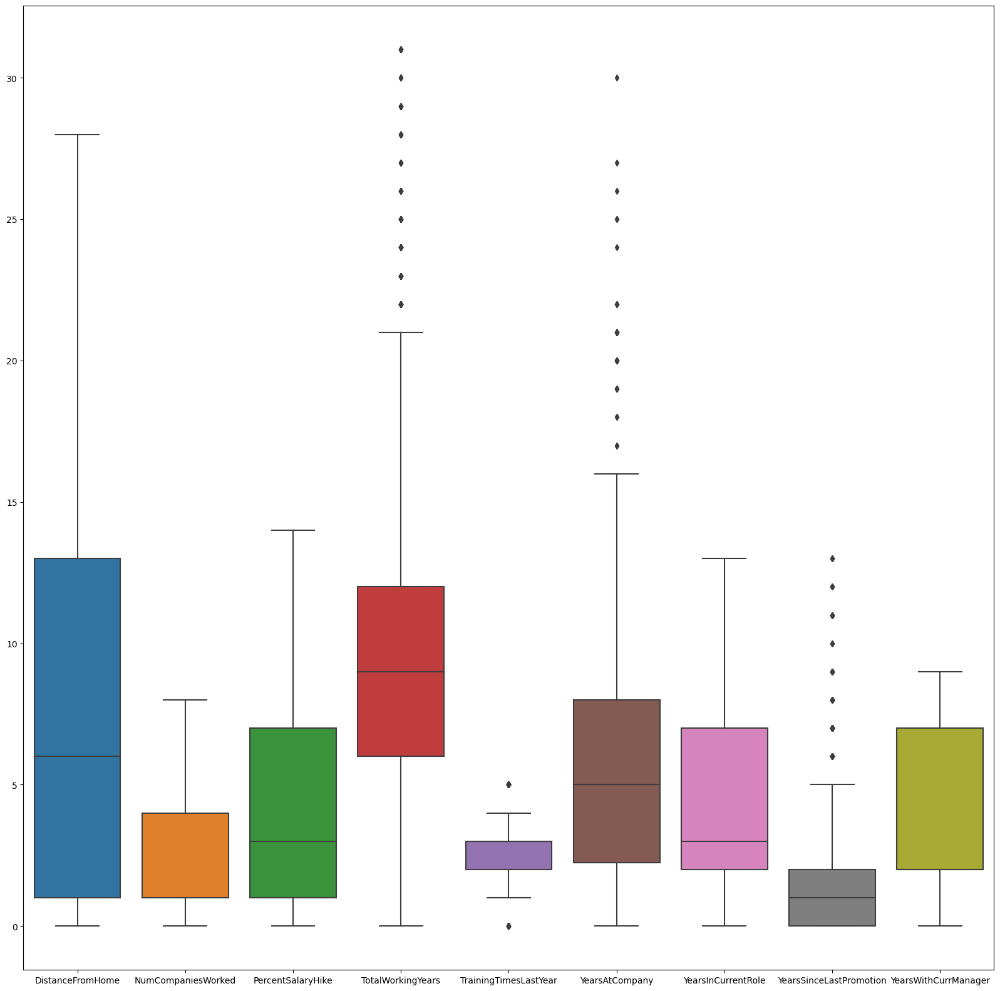

In [59]:
fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new[["DistanceFromHome","NumCompaniesWorked","PercentSalaryHike","TotalWorkingYears","TrainingTimesLastYear","YearsAtCompany","YearsInCurrentRole","YearsSinceLastPromotion","YearsWithCurrManager"]],ax=ax)
plt.show()

In [62]:
#Now we will split the dataset

X=df_new.drop(columns="Attrition")

In [63]:
X

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23,2,624,2,0,1,1,0,1,0,...,0,0,0,8,0,0,6,4,0,5
1,31,1,113,1,7,0,1,1,2,1,...,1,3,1,10,3,2,10,7,1,7
2,19,2,805,1,1,1,4,2,3,1,...,0,1,0,7,3,2,0,0,0,0
3,15,1,820,1,2,3,1,3,3,0,...,0,2,0,8,3,2,8,7,3,0
5,14,1,572,1,1,1,1,5,3,1,...,0,2,0,8,2,1,7,7,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18,1,494,1,22,1,3,1465,2,1,...,0,2,1,17,3,2,5,2,0,3
1466,21,2,327,1,5,0,3,1466,3,1,...,0,0,1,9,5,2,7,7,1,7
1467,9,2,39,1,3,2,1,1467,1,1,...,1,1,1,6,0,2,6,2,0,3
1468,31,1,579,2,1,2,3,1468,3,1,...,0,3,0,17,3,1,9,6,0,8


In [64]:
y=df_new["Attrition"]

In [65]:
y

0       1
1       0
2       1
3       0
5       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1214, dtype: int64

In [66]:
#Now we will scale the data

scaler=StandardScaler()
scaler.fit_transform(df_new)

array([[ 0.5651291 ,  2.19921315,  0.58813811, ...,  0.11622129,
        -0.66703656,  0.52226139],
       [ 1.47427831, -0.45470809, -0.93101011, ...,  1.10288319,
        -0.27144184,  1.21670315],
       [ 0.11055449,  2.19921315,  0.58813811, ..., -1.1993279 ,
        -0.66703656, -1.21384301],
       ...,
       [-1.02588202, -0.45470809,  0.58813811, ..., -0.5415533 ,
        -0.66703656, -0.17218037],
       [ 1.47427831, -0.45470809, -0.93101011, ...,  0.77399589,
        -0.66703656,  1.56392403],
       [-0.23037646, -0.45470809,  0.58813811, ..., -0.212666  ,
        -0.27144184, -0.51940125]])

In [67]:
df_new_scalar=pd.DataFrame(scaler.fit_transform(df_new))

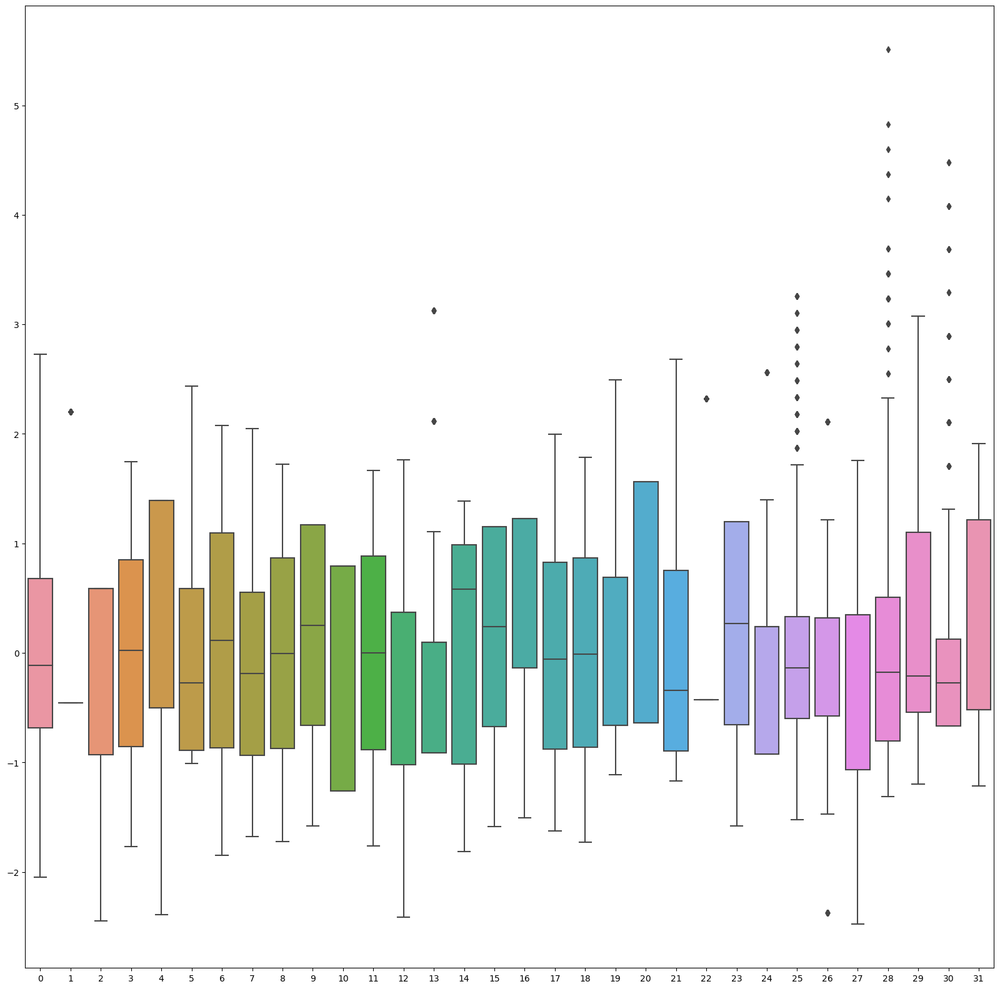

In [68]:
fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new_scalar,ax=ax)
plt.show()

In [69]:
X_scaled=scaler.fit_transform(X)

In [70]:
X_scaled

array([[ 0.5651291 ,  0.58813811,  0.70941869, ...,  0.11622129,
        -0.66703656,  0.52226139],
       [ 1.47427831, -0.93101011, -1.32286357, ...,  1.10288319,
        -0.27144184,  1.21670315],
       [ 0.11055449,  0.58813811,  1.42926818, ..., -1.1993279 ,
        -0.66703656, -1.21384301],
       ...,
       [-1.02588202,  0.58813811, -1.61716667, ..., -0.5415533 ,
        -0.66703656, -0.17218037],
       [ 1.47427831, -0.93101011,  0.53045059, ...,  0.77399589,
        -0.66703656,  1.56392403],
       [-0.23037646,  0.58813811, -0.43597718, ..., -0.212666  ,
        -0.27144184, -0.51940125]])

In [71]:
y

0       1
1       0
2       1
3       0
5       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1214, dtype: int64

In [72]:
#Now need to check the multicollinearity

vif_df=pd.DataFrame()

In [74]:
X_scaled.shape

(1214, 31)

In [75]:
X_scaled.shape[1]

31

In [76]:
vif_df['vif']= [variance_inflation_factor(X_scaled,i)for i in range(X_scaled.shape[1])]

vif_df['feature']=X.columns

In [77]:
vif_df

,vif,feature
0,1.837946,Age
1,1.017998,BusinessTravel
2,1.032896,DailyRate
3,2.163358,Department
4,1.016049,DistanceFromHome
5,1.069729,Education
6,1.019115,EducationField
7,1.031590,EmployeeNumber
8,1.030323,EnvironmentSatisfaction
9,1.023205,Gender


In [141]:
x_train , x_test , y_train , y_test=train_test_split(X_scaled, y , test_size=.20 , random_state=144)

In [142]:
x_train

array([[ 1.13334735,  0.58813811,  1.63607577, ..., -0.5415533 ,
        -0.66703656, -0.17218037],
       [ 1.0197037 , -2.45015833, -1.16775788, ...,  1.10288319,
         0.9153423 ,  0.52226139],
       [ 1.47427831,  0.58813811,  0.70146455, ..., -1.1993279 ,
        -0.66703656, -1.21384301],
       ...,
       [-0.57130742,  0.58813811,  0.64578559, ..., -0.5415533 ,
        -0.27144184,  0.17504051],
       [-1.02588202, -0.93101011, -1.28706995, ...,  1.10288319,
        -0.27144184,  1.21670315],
       [-0.00308916,  0.58813811, -1.23536805, ..., -0.212666  ,
        -0.27144184, -0.17218037]])

In [143]:
x_test

array([[ 0.11055449,  0.58813811, -1.29104701, ...,  1.10288319,
        -0.27144184,  1.21670315],
       [-0.00308916,  0.58813811,  1.13496507, ...,  1.76065778,
        -0.27144184,  1.21670315],
       [-1.02588202,  0.58813811,  1.36961215, ..., -0.212666  ,
        -0.27144184, -0.51940125],
       ...,
       [-0.79859472,  0.58813811,  0.97190525, ..., -1.1993279 ,
        -0.66703656, -1.21384301],
       [-0.91223837,  0.58813811, -0.08997218, ...,  1.10288319,
         2.10212644,  0.52226139],
       [ 1.36063465,  0.58813811,  1.05144663, ..., -0.5415533 ,
        -0.66703656, -0.51940125]])

# Logistic Regression

In [144]:
logr=LogisticRegression(verbose=1)

In [145]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [146]:
logr.predict(x_test[[1]])

array([0], dtype=int64)

In [147]:
logr.predict_proba(x_test[[1]])

array([[0.82219405, 0.17780595]])

In [148]:
logr.predict_log_proba(x_test[[1]])

array([[-0.19577884, -1.72706248]])

In [149]:
y_pred=logr.predict(x_test)

In [150]:
y_pred

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0], dtype=int64)

In [151]:
confusion_matrix(y_test,y_pred)

array([[196,   8],
       [ 25,  14]], dtype=int64)

In [152]:
accuracy_score(y_test,y_pred)

0.8641975308641975

In [153]:
auc=roc_auc_score(y_test,y_pred)

In [154]:
auc

0.6598793363499246

In [155]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       204
           1       0.64      0.36      0.46        39

    accuracy                           0.86       243
   macro avg       0.76      0.66      0.69       243
weighted avg       0.85      0.86      0.85       243



In [156]:
fpr, tpr, thresholds= roc_curve(y_test,y_pred)

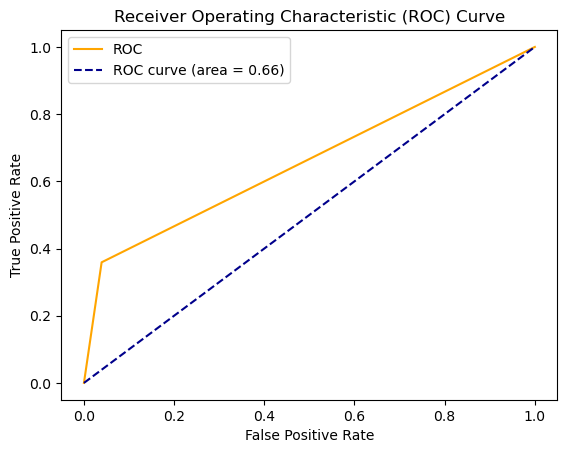

In [157]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [158]:
pickle.dump(logr,open("attrition_logr_model.pickle","wb"))

In [159]:
logr_liblinear=LogisticRegression(verbose=1)

In [160]:
logr_liblinear.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [161]:
logr_liblinear.predict(x_test[[1]])

array([0], dtype=int64)

In [162]:
logr_liblinear.predict_proba(x_test[[1]])

array([[0.82219405, 0.17780595]])

In [163]:
logr_liblinear.predict_log_proba(x_test[[1]])

array([[-0.19577884, -1.72706248]])

In [164]:
y_pred_liblinear=logr_liblinear.predict(x_test)

In [165]:
y_pred_liblinear

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0], dtype=int64)

In [166]:
confusion_matrix(y_test,y_pred_liblinear)

array([[196,   8],
       [ 25,  14]], dtype=int64)

In [167]:
accuracy_score(y_test,y_pred_liblinear)

0.8641975308641975

In [168]:
auc_liblinear=roc_auc_score(y_test,y_pred_liblinear)

In [169]:
auc_liblinear

0.6598793363499246

In [170]:
print(classification_report(y_test,y_pred_liblinear))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       204
           1       0.64      0.36      0.46        39

    accuracy                           0.86       243
   macro avg       0.76      0.66      0.69       243
weighted avg       0.85      0.86      0.85       243



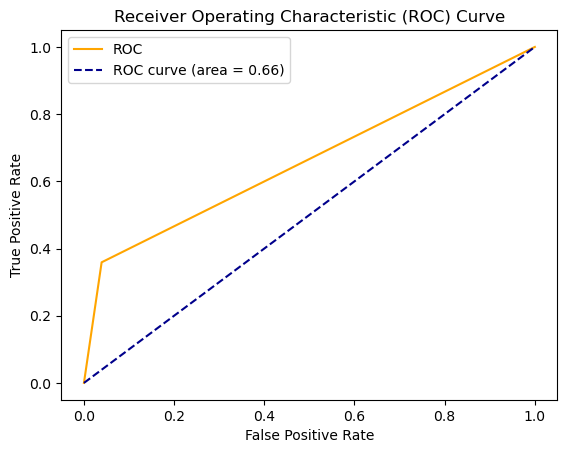

In [171]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc_liblinear)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [172]:
pickle.dump(logr_liblinear,open("attrition_logrliblinear_model.pickle","wb"))